## Exploratory Time Series Analysis with Reddit Based Lucey Uncertainty Index
* Identifying if our baseline ```Reddit UCRY``` indices serve as a leading indicator for various cryptocurrencies
* Further analysis on its relationship with existing volatility and returns indicators for crypto
* Locate any relationships with other asset classes (E.g. SP500, Gold, etc.)

### Set Up

In [1]:
# NB config
%load_ext autoreload
%autoreload 2

# Load Libraries
import os

os.chdir("../../")
import toml
import warnings
import isoweek
import pandas as pd
import numpy as np
import importlib
import scipy.stats as stats
import altair as alt
from arch.unitroot import ADF, DFGLS, KPSS
from typing import Dict, Union
from pathlib import Path
from datetime import datetime
from darts import TimeSeries
from darts.utils import statistics as dstats
from altair import pipe, limit_rows, to_values
from sqlalchemy import create_engine

# Suppress warnings
warnings.filterwarnings("ignore")

/Users/christopherliew/Desktop/Y4S1/HT/crypto_uncertainty_index/.venv/crypto-uncertainty-index-SX872G0E-py3.8/lib/python3.8/site-packages/darts/timeseries.py:39: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  VALID_INDEX_TYPES = (pd.DatetimeIndex, pd.RangeIndex, pd.Int64Index)
/Users/christopherliew/Desktop/Y4S1/HT/crypto_uncertainty_index/.venv/crypto-uncertainty-index-SX872G0E-py3.8/lib/python3.8/site-packages/darts/timeseries.py:512: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  times: Union[pd.DatetimeIndex, pd.Int64Index],
/Users/christopherliew/Desktop/Y4S1/HT/crypto_uncertainty_index/.venv/crypto-uncertainty-index-SX872G0E-py3.8/lib/python3.8/site-packages/darts/timeseries.py:738: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a fu

In [2]:
# Increase Max Rows for Altair
t = lambda data: pipe(data, limit_rows(max_rows=10000), to_values)
alt.data_transformers.register("custom", t)
alt.data_transformers.enable("custom")

DataTransformerRegistry.enable('custom')

In [3]:
# Connect to postgres
pg_config = toml.load(Path() / "config" / "etl_config.toml")["postgres"]
pg_engine = create_engine(pg_config["default_local_uri"], echo=True)

### Pull Relevant Data

In [4]:
# Set Date Range
START_DATE, END_DATE = "2014-01-01", "2021-12-31"

In [5]:
def get_week_start_end_from_date(date):
    date = datetime.strptime(date, "%Y-%m-%d")
    year, week = date.isocalendar()[0], date.isocalendar()[1]  # year, week, weekday
    w = isoweek.Week(year, week)
    return w.monday(), w.sunday()

In [6]:
# Original Lucey UCRY Index Data
index_data_path = (
    Path(
        "/Users/christopherliew/Desktop/Y4S1/HT/crypto_uncertainty_index/pipelines/crypto_index"
    )
    / "data"
)

ucry_original = pd.read_csv(index_data_path / "ucry_lucey_original_.csv")
ucry_original_policy = ucry_original[["Date", "UCRY Policy"]]
ucry_original_price = ucry_original[["Date", "UCRY Price"]]

# Process dates
# Break up timeline column

# Create start date and end date
ucry_original_policy[["start_date", "end_date"]] = pd.DataFrame(
    ucry_original_policy["Date"]
    .apply(lambda x: get_week_start_end_from_date(x))
    .tolist(),
    index=ucry_original_policy.index,
)

ucry_original_policy.drop(columns=["Date"], inplace=True)
ucry_original_policy.rename(columns={"UCRY Policy": "index_value"}, inplace=True)
ucry_original_policy["type"] = "Lucey-Original-Policy"


ucry_original_price[["start_date", "end_date"]] = pd.DataFrame(
    ucry_original_price["Date"]
    .apply(lambda x: get_week_start_end_from_date(x))
    .tolist(),
    index=ucry_original_price.index,
)

ucry_original_price.drop(columns=["Date"], inplace=True)
ucry_original_price.rename(columns={"UCRY Price": "index_value"}, inplace=True)
ucry_original_price["type"] = "Lucey-Original-Price"

In [7]:
# UCRY Index Data
# Lucey Price
ucry_query = f"""
    SELECT *
    FROM ucry_index
    """

ucry_reddit = pd.read_sql(sql=ucry_query, con=pg_engine)
ucry_reddit["type"] = ucry_reddit["type"].map(
    {
        "lucey-price": "Lucey-Reddit-Price",
        "lucey-policy": "Lucey-Reddit-Policy",
        "lda-price": "LDA-Reddit-Price",
        "lda-policy": "LDA-Reddit-Policy",
        "top2vec-price": "Top2Vec-Reddit-Price",
        "top2vec-policy": "Top2Vec-Reddit-Policy",
        "bertweet-hedge": "BERTweet-Hedge",
    }
)

ucry_price = ucry_reddit[ucry_reddit.type == "Lucey-Reddit-Price"]
ucry_policy = ucry_reddit[ucry_reddit.type == "Lucey-Reddit-Policy"]
ucry_lda_price = ucry_reddit[ucry_reddit.type == "LDA-Reddit-Price"]
ucry_lda_policy = ucry_reddit[ucry_reddit.type == "LDA-Reddit-Policy"]
ucry_t2v_price = ucry_reddit[ucry_reddit.type == "Top2Vec-Reddit-Price"]
ucry_t2v_policy = ucry_reddit[ucry_reddit.type == "Top2Vec-Reddit-Policy"]
hedge = ucry_reddit[ucry_reddit.type == "BERTweet-Hedge"]

2022-04-03 02:49:49,034 INFO sqlalchemy.engine.Engine select pg_catalog.version()
2022-04-03 02:49:49,034 INFO sqlalchemy.engine.Engine [raw sql] {}
2022-04-03 02:49:49,037 INFO sqlalchemy.engine.Engine select current_schema()
2022-04-03 02:49:49,037 INFO sqlalchemy.engine.Engine [raw sql] {}
2022-04-03 02:49:49,040 INFO sqlalchemy.engine.Engine show standard_conforming_strings
2022-04-03 02:49:49,041 INFO sqlalchemy.engine.Engine [raw sql] {}
2022-04-03 02:49:49,044 INFO sqlalchemy.engine.Engine select relname from pg_class c join pg_namespace n on n.oid=c.relnamespace where pg_catalog.pg_table_is_visible(c.oid) and relname=%(name)s
2022-04-03 02:49:49,044 INFO sqlalchemy.engine.Engine [generated in 0.00046s] {'name': '\n    SELECT *\n    FROM ucry_index\n    '}
2022-04-03 02:49:49,049 INFO sqlalchemy.engine.Engine 
    SELECT *
    FROM ucry_index
    
2022-04-03 02:49:49,050 INFO sqlalchemy.engine.Engine [raw sql] {}


In [8]:
# Combined UCRY
ucry_combined = pd.concat(
    [ucry_reddit, ucry_original_price, ucry_original_policy], axis=0
)
ucry_combined["start_date"] = pd.to_datetime(ucry_combined["start_date"], utc=True)
ucry_combined["end_date"] = pd.to_datetime(ucry_combined["end_date"], utc=True)

**Load and Process CRIX and VCRIX data**

In [9]:
# Load Data
vcrix = (
    pd.read_csv(
        "/Users/christopherliew/Desktop/Y4S1/HT/crypto_uncertainty_index/etl/raw_data_dump/crix/vcrix.csv"
    )
)[["date", "vcrix"]].rename(columns={"date": "start_date", "vcrix": "index_value"})
vcrix["type"] = "VCRIX"
vcrix["start_date"] = pd.to_datetime(vcrix["start_date"])
vcrix = vcrix.set_index("start_date")

# Aggregate to Weekly Level
vcrix = vcrix.resample("W-MON").agg({"index_value": "mean"}).reset_index()
vcrix["type"] = "VCRIX"

In [10]:
# Update UCRY combined
ucry_combined = pd.concat([ucry_combined, vcrix], axis=0)
ucry_combined["start_date"] = pd.to_datetime(ucry_combined["start_date"], utc=True)

# Get rid of UTC Time
ucry_combined["start_date"] = ucry_combined["start_date"].dt.tz_localize(None)
ucry_combined["end_date"] = ucry_combined["end_date"].dt.tz_localize(None)

In [11]:
# Crypto Price Data
asset_types_query = """
    SELECT DISTINCT ticker
    FROM asset_prices
    """

asset_types = [i for i in pg_engine.execute(asset_types_query)]

2022-04-03 02:49:49,300 INFO sqlalchemy.engine.Engine 
    SELECT DISTINCT ticker
    FROM asset_prices
    
2022-04-03 02:49:49,300 INFO sqlalchemy.engine.Engine [raw sql] {}


In [12]:
# Get respective time series
combined_df = pd.read_sql(sql="SELECT * FROM asset_prices", con=pg_engine)
btc_usd = combined_df[combined_df.ticker == "BTC-USD"]
eth_usd = combined_df[combined_df.ticker == "ETH-USD"]
luna_usd = combined_df[combined_df.ticker == "LUNA-USD"]
tether_usd = combined_df[combined_df.ticker == "USDT-USD"]
ripple_usd = combined_df[combined_df.ticker == "XRP-USD"]
polkadot_usd = combined_df[combined_df.ticker == "DOT-USD"]
cardano_usd = combined_df[combined_df.ticker == "ADA-USD"]
binance_usd = combined_df[combined_df.ticker == "BNB-USD"]

2022-04-03 02:49:49,369 INFO sqlalchemy.engine.Engine select relname from pg_class c join pg_namespace n on n.oid=c.relnamespace where pg_catalog.pg_table_is_visible(c.oid) and relname=%(name)s
2022-04-03 02:49:49,370 INFO sqlalchemy.engine.Engine [cached since 0.3263s ago] {'name': 'SELECT * FROM asset_prices'}
2022-04-03 02:49:49,376 INFO sqlalchemy.engine.Engine SELECT * FROM asset_prices
2022-04-03 02:49:49,377 INFO sqlalchemy.engine.Engine [raw sql] {}


In [13]:
# Other Data
sp500 = combined_df[combined_df.ticker == "^GSPC"]
gold = combined_df[combined_df.ticker == "GC=F"]

In [14]:
ucry_combined.type.unique()

array(['Lucey-Reddit-Price', 'Lucey-Reddit-Policy', 'LDA-Reddit-Price',
       'Top2Vec-Reddit-Price', 'Top2Vec-Reddit-Policy',
       'LDA-Reddit-Policy', 'BERTweet-Hedge', 'Lucey-Original-Price',
       'Lucey-Original-Policy', 'VCRIX'], dtype=object)

### Exploratory Analysis: Identifying if UCRY Reddut Lucey (Reddit Based) is a Leading Indicator
#### Overview of Approach
1. Convert to Darts' TimeSeries
2. Price and Volume at different Horizons
   * Adjusted Closing Price (hereafter ```Price```)
   * Trade Volumes 
3. Returns and Volatility at different Horizons
   * Price Returns
4. Compute Cross Correlations for each Pair of Asset Price / Volume / Price Returns across different horizons and UCRY


In [15]:
# Helper to convert to TS Dataset
def pd_to_darts(df: pd.DataFrame, time_col: str = "date") -> TimeSeries:
    new_df = TimeSeries.from_dataframe(
        df.reset_index(drop=True).drop(columns=["ticker"]), time_col=time_col
    )
    return new_df

In [16]:
# Convert to Time Series Datasets
btc_usd_ts = pd_to_darts(btc_usd)
eth_usd_ts = pd_to_darts(eth_usd)
luna_usd_ts = pd_to_darts(luna_usd)
tether_usd_ts = pd_to_darts(tether_usd)
ripple_usd_ts = pd_to_darts(ripple_usd)
polkadot_usd_ts = pd_to_darts(polkadot_usd)
cardano_usd_ts = pd_to_darts(cardano_usd)
binance_usd_ts = pd_to_darts(binance_usd)
sp500_ts = pd_to_darts(sp500)
gold_ts = pd_to_darts(gold)

In [17]:
# Create TS datasets for relevant indices
ucry_reddit_price_ts = TimeSeries.from_dataframe(
    ucry_combined[ucry_combined.type == "Lucey-Reddit-Price"][
        ["start_date", "index_value"]
    ],
    time_col="start_date",
)
ucry_reddit_policy_ts = TimeSeries.from_dataframe(
    ucry_combined[ucry_combined.type == "Lucey-Reddit-Policy"][
        ["start_date", "index_value"]
    ],
    time_col="start_date",
)
ucry_vcrix_ts = TimeSeries.from_dataframe(
    ucry_combined[ucry_combined.type == "VCRIX"][["start_date", "index_value"]],
    time_col="start_date",
)
ucry_price_ts = TimeSeries.from_dataframe(
    ucry_combined[ucry_combined.type == "Lucey-Original-Price"][
        ["start_date", "index_value"]
    ],
    time_col="start_date",
)
ucry_policy_ts = TimeSeries.from_dataframe(
    ucry_combined[ucry_combined.type == "Lucey-Original-Policy"][
        ["start_date", "index_value"]
    ],
    time_col="start_date",
)

# Topic Modelling Based
lda_reddit_price_ts = TimeSeries.from_dataframe(
    ucry_combined[ucry_combined.type == "LDA-Reddit-Price"][
        ["start_date", "index_value"]
    ],
    time_col="start_date",
)

lda_reddit_policy_ts = TimeSeries.from_dataframe(
    ucry_combined[ucry_combined.type == "LDA-Reddit-Policy"][
        ["start_date", "index_value"]
    ],
    time_col="start_date",
)

t2v_reddit_price_ts = TimeSeries.from_dataframe(
    ucry_combined[ucry_combined.type == "Top2Vec-Reddit-Price"][
        ["start_date", "index_value"]
    ],
    time_col="start_date",
)

t2v_reddit_policy_ts = TimeSeries.from_dataframe(
    ucry_combined[ucry_combined.type == "Top2Vec-Reddit-Policy"][
        ["start_date", "index_value"]
    ],
    time_col="start_date",
)

hedge_ts = TimeSeries.from_dataframe(
    ucry_combined[ucry_combined.type == "BERTweet-Hedge"][
        ["start_date", "index_value"]
    ],
    time_col="start_date",
)

#### 2 Price and Volume Analyses
##### 2.1 UCRY Lags against Prices Analysis
Plot UCRY price and policy against Prices = Adjusted Closing Price (Weekly Granularity)
1. UCRY vs Prices at ***h = 1 weeks***
2. UCRY vs Prices at ***h = 4 weeks*** 
3. UCRY vs Prices at ***h = 12 weeks***
4. UCRY vs Prices at ***h = 24 weeks***

##### Dataset Prep

In [18]:
# Prep Datasets
asset = combined_df[["date", "ticker", "adj_close", "volume"]].rename(
    columns={
        "date": "Date",
        "ticker": "Ticker",
        "adj_close": "Price",
        "volume": "Volume",
    }
)

# Select relevant UCRY indices
ucry = ucry_combined[["start_date", "type", "index_value"]].rename(
    columns={
        "start_date": "Date",
        "type": "Index",
        "index_value": "Index Value (Standardised)",
    }
)[
    ucry_combined["type"].isin(
        [
            "Lucey-Original-Price",
            "Lucey-Original-Policy",
            "Lucey-Reddit-Price",
            "Lucey-Reddit-Policy",
            "VCRIX",
            "LDA-Reddit-Price",
            "LDA-Reddit-Policy",
            "Top2Vec-Reddit-Price",
            "Top2Vec-Reddit-Policy",
            "BERTweet-Hedge",
        ]
    )
]
ucry["Date"] = pd.to_datetime(ucry["Date"], utc=True).dt.tz_localize(None)

##### Write Datasets

In [19]:
data_dir = Path("forecasting/data/modelling")

In [20]:
# BTC-USD Asset Dataset
btc_usd = asset[asset.Ticker == "BTC-USD"][["Date", "Price", "Volume"]]
btc_usd.to_csv(data_dir / "btc_usd_weekly.csv", index=False)

In [21]:
# UCRY Indicies Dataset
ucry_indices = ucry.rename(columns={"Index Value (Standardised)": "Index Value"})
ucry_indices.to_csv(data_dir / "ucry_indices_weekly.csv", index=False)

In [22]:
# Correlation P-val  Helper for DataFrame
def calculate_pvalues(df):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how="outer")
    for r in df.columns:
        for c in df.columns:
            pvalues[r][c] = round(stats.pearsonr(df[r], df[c])[1], 5)
    return pvalues

In [23]:
# Correlation Matrix (Remove VCRIX first)
corr_df = ucry.dropna().pivot_table(
    index=ucry["Date"], values="Index Value (Standardised)", columns="Index"
)
corr_mat = corr_df.corr()
corr_mat[["VCRIX"]]

Index,VCRIX
Index,
BERTweet-Hedge,0.167468
LDA-Reddit-Policy,0.153195
LDA-Reddit-Price,0.147077
Lucey-Original-Policy,0.258539
Lucey-Original-Price,0.255110
Lucey-Reddit-Policy,0.191735
Lucey-Reddit-Price,0.138782
Top2Vec-Reddit-Policy,0.183765
Top2Vec-Reddit-Price,0.124188


In [24]:
calculate_pvalues(corr_df)["VCRIX"]

Index
BERTweet-Hedge           0.00444
LDA-Reddit-Policy        0.00934
LDA-Reddit-Price         0.01262
Lucey-Original-Policy    0.00001
Lucey-Original-Price     0.00001
Lucey-Reddit-Policy       0.0011
Lucey-Reddit-Price       0.01866
Top2Vec-Reddit-Policy    0.00177
Top2Vec-Reddit-Price     0.03548
VCRIX                        0.0
Name: VCRIX, dtype: object

In [25]:
alt.Chart(
    ucry[ucry["Index"].isin(["Top2Vec-Reddit-Price", "Top2Vec-Reddit-Policy"])]
).mark_line().encode(
    x="Date:T",
    y=alt.Y("Index Value (Standardised):Q", scale=alt.Scale(domain=[95, 115])),
    color=alt.Color("Index:N", scale=alt.Scale(scheme="plasma")),
    strokeDash="Index:N",
).properties(
    width=600
)

alt.Chart(...)

In [26]:
alt.Chart(
    ucry[ucry["Index"].isin(["Lucey-Reddit-Price", "Lucey-Reddit-Policy"])]
).mark_line().encode(
    x="Date:T",
    y=alt.Y("Index Value (Standardised):Q", scale=alt.Scale(domain=[95, 115])),
    color=alt.Color("Index:N", scale=alt.Scale(scheme="plasma")),
    strokeDash="Index:N",
).properties(
    width=600
)

alt.Chart(...)

In [27]:
alt.Chart(
    ucry[ucry["Index"].isin(["LDA-Reddit-Price", "LDA-Reddit-Policy"])]
).mark_line().encode(
    x="Date:T",
    y=alt.Y("Index Value (Standardised):Q", scale=alt.Scale(domain=[95, 115])),
    color=alt.Color("Index:N", scale=alt.Scale(scheme="plasma")),
    strokeDash="Index:N",
).properties(
    width=600
)

alt.Chart(...)

**Helper to Generate Faceted Chart of Price against UCRY (To be updated)**

In [28]:
def gen_Y_vs_ucry_chart(lags_in_weeks=None, Y="Price"):

    # Select horizon
    y_label = f"{Y} (Lag={lags_in_weeks})" if lags_in_weeks is not None else "Price"
    data = asset[asset["Ticker"] == "BTC-USD"][["Date", "Ticker", y_label]]

    # Asset Class Line Chart
    asset_line = (
        alt.Chart()
        .mark_line(interpolate="basis")
        .encode(
            x="Date:T",
            y=alt.Y(
                f"{y_label}:Q",
                scale=alt.Scale(type="log"),
                title="Weekly Price Returns (Log-Scale)",
            ),  # title=f'Lagged {Y} (Log-Scale) by {1 if lags_in_weeks is None else lags_in_weeks} Weeks'), # Change back to 0
            # color='Ticker:N',
            color=alt.value("#FF0000"),
            tooltip=["Date", y_label, "Ticker"],
        )
        .properties(width=600)
    )

    # UCRY Lucey Line Chart
    ucry_line = (
        alt.Chart(
            ucry[
                ucry.Index.str.contains(
                    "(Lucey-Reddit-Policy|Lucey-Reddit-Price|Top2Vec-Reddit-Policy)"
                )
            ]
        )
        .mark_line(interpolate="basis")
        .encode(
            x="Date:T",
            y=alt.Y("Index Value (Standardised):Q", scale=alt.Scale(domain=[93, 108])),
            color=alt.Color("Index:N", scale=alt.Scale(scheme="plasma")),
            strokeDash="Index:N",
            tooltip=["Date", "Index Value (Standardised)", "Index"],
        )
        .properties(width=600)
    )

    # Generate multiple charts for each Ticker
    price_chart_gen = (
        alt.layer(
            asset_line,
            ucry_line,
            data=data.dropna(),
            title=f"{asset_name} {Y} vs UCRY Indices",
        )
        .transform_filter(alt.datum.Ticker == asset_name)
        .resolve_scale(y="independent", x="independent")
        for asset_name in data.Ticker.unique()
    )

    alt.concat(*price_chart_gen, columns=1).display()

**Helper to create Correlation Matrix**

In [29]:
def get_pearson_corr(
    ts1: pd.DataFrame,  # Target
    ts2: pd.DataFrame,  # Pred
    ts1_col: str,
    ts2_col: str,
    ts1_query: str,
    ts2_query: str,
    pred_lags: int = 0,
) -> Dict[str, np.float]:
    ts1 = ts1.query(ts1_query).reset_index(drop=True)
    ts2 = ts2.query(ts2_query).reset_index(drop=True)
    ts12 = ts1.merge(ts2, on="Date")  # Inner join to align dates
    ts1 = ts12[ts1_col]
    ts2 = ts12[ts2_col].shift(pred_lags).dropna().reset_index(drop=True)
    ts_combined = pd.concat([ts1, ts2], axis=1).dropna()
    # Compute pearsons' correlation coefficient
    r, p = stats.pearsonr(ts_combined[ts1_col], ts_combined[ts2_col])
    return f"""{np.round(r, 4)} ({np.round(p, 4)})"""

In [30]:
def gen_corr_mat(
    pred_df: pd.DataFrame,
    pred_col: str,
    target_df: pd.DataFrame,
    target_col: str,
    pred_lags: int,
    target_cat_col: str = "Ticker",
    pred_cat_col: str = "Index",
):
    targets = target_df[target_cat_col].unique().tolist()
    preds = pred_df[pred_cat_col].unique().tolist()
    corr_mat = pd.DataFrame(columns=targets, index=preds)
    for t in targets:
        for i in preds:
            corr_mat.loc[i, t] = get_pearson_corr(
                target_df,
                pred_df,
                target_col,
                pred_col,
                f"{target_cat_col} == '{t}'",
                f"{pred_cat_col} == '{i}'",
                pred_lags,
            )
    return corr_mat

**Prices where h = 1 weeks**

In [31]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Price",
    1,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,0.1023 (0.0464),0.135 (0.0476),0.0198 (0.7726),0.3012 (0.0),0.054 (0.4295),0.1587 (0.0196),0.0659 (0.5848),0.3838 (0.0),-0.0234 (0.6335),0.1308 (0.0075)
Lucey-Reddit-Policy,0.269 (0.0),0.2529 (0.0002),-0.0052 (0.939),0.276 (0.0),0.1871 (0.0058),0.2613 (0.0001),0.0412 (0.733),0.2596 (0.0001),0.1577 (0.0012),0.2035 (0.0)
LDA-Reddit-Price,0.3721 (0.0),0.3143 (0.0),-0.03 (0.6605),0.3443 (0.0),0.2532 (0.0002),0.3004 (0.0),0.2444 (0.04),0.1752 (0.0099),0.2175 (0.0),0.386 (0.0)
Top2Vec-Reddit-Price,0.1491 (0.0036),0.1139 (0.0951),0.0163 (0.812),0.2566 (0.0001),0.0465 (0.4968),0.1214 (0.075),0.0881 (0.4648),0.262 (0.0001),0.0224 (0.6488),0.1808 (0.0002)
Top2Vec-Reddit-Policy,0.1733 (0.0007),0.2029 (0.0027),-0.0016 (0.9814),0.1683 (0.0133),0.1482 (0.0295),0.1959 (0.0038),-0.0527 (0.6627),0.1097 (0.1078),0.0573 (0.2427),0.041 (0.4041)
LDA-Reddit-Policy,0.0696 (0.1757),0.1632 (0.0164),0.0597 (0.3824),0.2158 (0.0014),0.1058 (0.1209),0.1671 (0.0139),0.0346 (0.7747),0.1774 (0.009),-0.0586 (0.2328),-0.0826 (0.092)
BERTweet-Hedge,0.4544 (0.0),0.6356 (0.0),-0.1005 (0.1408),0.4333 (0.0),0.6224 (0.0),0.6116 (0.0),0.6206 (0.0),-0.0453 (0.5077),0.1576 (0.0012),0.3626 (0.0)
Lucey-Original-Price,0.881 (0.0),0.824 (0.0),-0.1194 (0.0799),0.5476 (0.0),0.7681 (0.0),0.8314 (0.0),0.6011 (0.0),0.0281 (0.6812),0.6446 (0.0),0.8023 (0.0)
Lucey-Original-Policy,0.8795 (0.0),0.8238 (0.0),-0.1087 (0.1112),0.556 (0.0),0.7721 (0.0),0.8264 (0.0),0.629 (0.0),0.0381 (0.5772),0.6382 (0.0),0.7925 (0.0)
VCRIX,0.2362 (0.0001),0.1733 (0.0107),0.0804 (0.239),0.2391 (0.0004),0.1146 (0.0931),0.2246 (0.0009),0.2807 (0.0177),0.3044 (0.0),0.1517 (0.0102),0.2387 (0.0)


**Prices where h = 4 weeks**

In [32]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Price",
    4,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,0.1065 (0.0387),0.1477 (0.0312),0.0194 (0.778),0.3045 (0.0),0.0618 (0.3694),0.1636 (0.0168),0.0721 (0.5591),0.3838 (0.0),-0.0231 (0.6387),0.1353 (0.0058)
Lucey-Reddit-Policy,0.2726 (0.0),0.2671 (0.0001),-0.0052 (0.9402),0.278 (0.0),0.1967 (0.0039),0.2654 (0.0001),0.0487 (0.6936),0.2599 (0.0001),0.1577 (0.0013),0.2063 (0.0)
LDA-Reddit-Price,0.3823 (0.0),0.3436 (0.0),-0.0315 (0.6479),0.3498 (0.0),0.2774 (0.0),0.3101 (0.0),0.2576 (0.0339),0.1744 (0.0108),0.2198 (0.0),0.3964 (0.0)
Top2Vec-Reddit-Price,0.1548 (0.0026),0.129 (0.0603),0.0153 (0.8242),0.2607 (0.0001),0.0572 (0.4058),0.1273 (0.0637),0.0943 (0.4441),0.2615 (0.0001),0.0234 (0.6351),0.1869 (0.0001)
Top2Vec-Reddit-Policy,0.1724 (0.0008),0.2068 (0.0024),-0.001 (0.9881),0.167 (0.0147),0.1488 (0.03),0.195 (0.0043),-0.0514 (0.6775),0.1103 (0.1083),0.056 (0.2554),0.0389 (0.4302)
LDA-Reddit-Policy,0.0678 (0.1889),0.1637 (0.0168),0.0614 (0.3727),0.2147 (0.0016),0.1032 (0.1334),0.1658 (0.0154),0.0377 (0.7601),0.1786 (0.009),-0.0601 (0.2222),-0.0861 (0.0802)
BERTweet-Hedge,0.4292 (0.0),0.6083 (0.0),-0.0953 (0.1658),0.4249 (0.0),0.5947 (0.0),0.5996 (0.0),0.6241 (0.0),-0.0402 (0.5595),0.1334 (0.0065),0.3327 (0.0)
Lucey-Original-Price,0.8794 (0.0),0.8317 (0.0),-0.1163 (0.0905),0.5429 (0.0),0.7705 (0.0),0.8291 (0.0),0.6043 (0.0),0.032 (0.6419),0.6372 (0.0),0.7977 (0.0)
Lucey-Original-Policy,0.8757 (0.0),0.8253 (0.0),-0.1046 (0.128),0.5504 (0.0),0.7688 (0.0),0.8223 (0.0),0.6284 (0.0),0.043 (0.5326),0.6294 (0.0),0.7848 (0.0)
VCRIX,0.2388 (0.0),0.1855 (0.0066),0.0803 (0.2432),0.241 (0.0004),0.1229 (0.0734),0.2287 (0.0008),0.284 (0.0189),0.3043 (0.0),0.1511 (0.0109),0.2428 (0.0)


**Price where h = 12 Weeks**

In [33]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Price",
    12,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,0.1302 (0.0123),0.2087 (0.0027),0.0174 (0.805),0.326 (0.0),0.0944 (0.1782),0.198 (0.0044),0.1353 (0.3028),0.3833 (0.0),-0.0214 (0.6667),0.1497 (0.0025)
Lucey-Reddit-Policy,0.2904 (0.0),0.3254 (0.0),-0.0046 (0.9479),0.2852 (0.0),0.2288 (0.001),0.2881 (0.0),0.1006 (0.4444),0.2609 (0.0002),0.1551 (0.0017),0.2106 (0.0)
LDA-Reddit-Price,0.3511 (0.0),0.3124 (0.0),-0.0246 (0.7259),0.3218 (0.0),0.2252 (0.0012),0.27 (0.0001),0.1915 (0.1427),0.184 (0.0083),0.1876 (0.0001),0.3668 (0.0)
Top2Vec-Reddit-Price,0.1698 (0.0011),0.1666 (0.017),0.0145 (0.8364),0.2736 (0.0001),0.0715 (0.3085),0.147 (0.0355),0.1324 (0.3134),0.2615 (0.0002),0.0196 (0.6939),0.1938 (0.0001)
Top2Vec-Reddit-Policy,0.1876 (0.0003),0.2529 (0.0003),-0.0005 (0.9942),0.1721 (0.0136),0.1699 (0.0149),0.2159 (0.0019),-0.0029 (0.9825),0.1112 (0.1125),0.0567 (0.2544),0.0403 (0.4176)
LDA-Reddit-Policy,0.0607 (0.2445),0.1711 (0.0142),0.0649 (0.3553),0.2103 (0.0025),0.0952 (0.1745),0.1611 (0.021),0.0328 (0.8035),0.1811 (0.0094),-0.0644 (0.1954),-0.0963 (0.0524)
BERTweet-Hedge,0.3703 (0.0),0.5704 (0.0),-0.0842 (0.2301),0.3843 (0.0),0.5453 (0.0),0.5619 (0.0),0.6096 (0.0),-0.0316 (0.6525),0.0793 (0.1108),0.2701 (0.0)
Lucey-Original-Price,0.8757 (0.0),0.851 (0.0),-0.1046 (0.1355),0.5104 (0.0),0.761 (0.0),0.8202 (0.0),0.6388 (0.0),0.0462 (0.5108),0.6112 (0.0),0.7731 (0.0)
Lucey-Original-Policy,0.8686 (0.0),0.8418 (0.0),-0.0923 (0.1881),0.5149 (0.0),0.7579 (0.0),0.8078 (0.0),0.653 (0.0),0.0572 (0.4151),0.6013 (0.0),0.7571 (0.0)
VCRIX,0.2577 (0.0),0.2441 (0.0004),0.08 (0.2539),0.2521 (0.0003),0.1618 (0.0204),0.2548 (0.0002),0.3418 (0.0075),0.3052 (0.0),0.1504 (0.0125),0.2562 (0.0)


**Price where h = 24 Weeks**

In [34]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Price",
    24,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,0.1595 (0.0025),0.3152 (0.0),0.0149 (0.8368),0.3622 (0.0),0.14 (0.0522),0.3359 (0.0),0.1935 (0.1877),0.3829 (0.0),-0.0207 (0.6819),0.1716 (0.0006)
Lucey-Reddit-Policy,0.31 (0.0),0.43 (0.0),-0.0036 (0.9602),0.3013 (0.0),0.2737 (0.0001),0.4287 (0.0),0.1559 (0.2899),0.2636 (0.0002),0.152 (0.0025),0.2183 (0.0)
LDA-Reddit-Price,0.3696 (0.0),0.4017 (0.0),-0.0235 (0.7459),0.3339 (0.0),0.2573 (0.0003),0.3736 (0.0),0.2349 (0.108),0.1864 (0.0094),0.1751 (0.0005),0.378 (0.0)
Top2Vec-Reddit-Price,0.2007 (0.0001),0.2654 (0.0002),0.0116 (0.8729),0.3102 (0.0),0.117 (0.105),0.2707 (0.0001),0.2035 (0.1654),0.2602 (0.0003),0.0195 (0.6994),0.2167 (0.0)
Top2Vec-Reddit-Policy,0.2088 (0.0001),0.3453 (0.0),0.0005 (0.9942),0.1891 (0.0084),0.2102 (0.0033),0.3353 (0.0),0.0802 (0.5881),0.112 (0.1209),0.0578 (0.2525),0.0423 (0.4029)
LDA-Reddit-Policy,0.0918 (0.0834),0.27 (0.0001),0.0628 (0.3853),0.2395 (0.0008),0.1461 (0.0426),0.2867 (0.0001),0.0819 (0.5799),0.1795 (0.0125),-0.0536 (0.2887),-0.085 (0.092)
BERTweet-Hedge,0.3009 (0.0),0.5382 (0.0),-0.0665 (0.358),0.3213 (0.0),0.49 (0.0),0.5569 (0.0),0.6026 (0.0),-0.0162 (0.8234),0.0111 (0.8264),0.1879 (0.0002)
Lucey-Original-Price,0.8503 (0.0),0.8109 (0.0),-0.0802 (0.2677),0.4317 (0.0),0.6837 (0.0),0.7865 (0.0),0.6197 (0.0),0.0955 (0.1863),0.576 (0.0),0.7177 (0.0)
Lucey-Original-Policy,0.8454 (0.0),0.8089 (0.0),-0.0651 (0.3686),0.4459 (0.0),0.6892 (0.0),0.7874 (0.0),0.6482 (0.0),0.1063 (0.141),0.5633 (0.0),0.699 (0.0)
VCRIX,0.205 (0.0008),0.1857 (0.0097),0.0945 (0.1912),0.2153 (0.0026),0.0839 (0.2459),0.2124 (0.003),0.3131 (0.0302),0.3213 (0.0),0.1093 (0.0769),0.2004 (0.0011)


##### 2.2 UCRY against Asset Volume Analysis
Plot UCRY price and policy against Prices = Trading Volume (Weekly Granularity)
1. UCRY vs Volume at ***h = 1***
2. UCRY vs Volume at ***h = 4*** 
3. UCRY vs Volume at ***h = 12***
4. UCRY vs Volume at ***h = 24***

**Volume when h=1**

In [35]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Volume",
    1,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,0.0496 (0.3352),0.0946 (0.1659),0.0413 (0.5457),0.0973 (0.154),0.1422 (0.0368),0.2118 (0.0017),0.5867 (0.0),0.3339 (0.0),0.0061 (0.9014),-0.0851 (0.0825)
Lucey-Reddit-Policy,0.2804 (0.0),0.3292 (0.0),0.2683 (0.0001),0.2435 (0.0003),0.2663 (0.0001),0.363 (0.0),0.4812 (0.0),0.1987 (0.0034),-0.0339 (0.4901),0.0031 (0.9492)
LDA-Reddit-Price,0.3257 (0.0),0.2843 (0.0),0.2679 (0.0001),0.2597 (0.0001),0.2763 (0.0),0.3382 (0.0),0.5162 (0.0),0.1629 (0.0165),0.0385 (0.4333),0.0287 (0.5596)
Top2Vec-Reddit-Price,0.1217 (0.0176),0.1014 (0.1375),0.0672 (0.3257),0.1411 (0.0383),0.1259 (0.0648),0.1939 (0.0042),0.567 (0.0),0.2545 (0.0002),0.0304 (0.5355),-0.038 (0.4391)
Top2Vec-Reddit-Policy,0.1905 (0.0002),0.3094 (0.0),0.2586 (0.0001),0.2104 (0.0019),0.228 (0.0007),0.319 (0.0),0.4792 (0.0),0.0994 (0.1455),-0.0338 (0.4914),0.0026 (0.9579)
LDA-Reddit-Policy,0.0541 (0.293),0.169 (0.0129),0.1498 (0.0277),0.1594 (0.019),0.1607 (0.0181),0.2293 (0.0007),0.3988 (0.0006),0.1909 (0.0049),-0.0108 (0.8267),-0.0277 (0.5727)
BERTweet-Hedge,0.2638 (0.0),0.4411 (0.0),0.4469 (0.0),0.2905 (0.0),0.541 (0.0),0.5601 (0.0),0.5964 (0.0),-0.0696 (0.3086),-0.0182 (0.7108),-0.0629 (0.2002)
Lucey-Original-Price,0.7396 (0.0),0.7398 (0.0),0.7766 (0.0),0.5978 (0.0),0.7621 (0.0),0.8463 (0.0),0.6955 (0.0),-0.0846 (0.2156),0.0126 (0.7978),0.1238 (0.0114)
Lucey-Original-Policy,0.7317 (0.0),0.7289 (0.0),0.7681 (0.0),0.6057 (0.0),0.7605 (0.0),0.8319 (0.0),0.6873 (0.0),-0.0659 (0.3348),0.0071 (0.8848),0.1322 (0.0069)
VCRIX,0.2024 (0.0006),0.0434 (0.5256),0.0031 (0.9639),-0.0736 (0.2815),0.0759 (0.2668),0.1114 (0.1024),0.2448 (0.0396),0.1875 (0.0057),0.0452 (0.4459),0.0664 (0.2631)


**Volume when h=4**

In [36]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Volume",
    4,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,0.0499 (0.3337),0.0955 (0.1651),0.0425 (0.537),0.0978 (0.1551),0.144 (0.0357),0.2124 (0.0018),0.5874 (0.0),0.3337 (0.0),0.006 (0.9032),-0.0871 (0.0768)
Lucey-Reddit-Policy,0.2798 (0.0),0.3294 (0.0),0.269 (0.0001),0.2441 (0.0003),0.2672 (0.0001),0.3633 (0.0),0.4792 (0.0),0.1991 (0.0035),-0.0336 (0.4955),0.0018 (0.9715)
LDA-Reddit-Price,0.3268 (0.0),0.2885 (0.0),0.2717 (0.0001),0.2599 (0.0001),0.2803 (0.0),0.3392 (0.0),0.5095 (0.0),0.1613 (0.0185),0.0385 (0.4351),0.029 (0.5565)
Top2Vec-Reddit-Price,0.1225 (0.0173),0.1037 (0.1315),0.0694 (0.3133),0.1412 (0.0395),0.1284 (0.0614),0.1944 (0.0044),0.5646 (0.0),0.2535 (0.0002),0.0303 (0.5389),-0.0387 (0.4327)
Top2Vec-Reddit-Policy,0.1896 (0.0002),0.3093 (0.0),0.258 (0.0001),0.2103 (0.002),0.2271 (0.0008),0.3187 (0.0),0.4791 (0.0),0.1006 (0.1434),-0.0334 (0.4974),0.0041 (0.9344)
LDA-Reddit-Policy,0.0529 (0.3054),0.1675 (0.0144),0.1486 (0.0302),0.1603 (0.0193),0.1601 (0.0194),0.2299 (0.0007),0.4064 (0.0006),0.1931 (0.0047),-0.0106 (0.8301),-0.0287 (0.5597)
BERTweet-Hedge,0.256 (0.0),0.4358 (0.0),0.4423 (0.0),0.2991 (0.0),0.5386 (0.0),0.572 (0.0),0.6545 (0.0),-0.0591 (0.3909),-0.013 (0.7925),-0.0533 (0.2794)
Lucey-Original-Price,0.7401 (0.0),0.7381 (0.0),0.7757 (0.0),0.6037 (0.0),0.7605 (0.0),0.8518 (0.0),0.7027 (0.0),-0.0786 (0.2535),0.0171 (0.7288),0.1342 (0.0062)
Lucey-Original-Policy,0.7331 (0.0),0.7282 (0.0),0.7679 (0.0),0.6137 (0.0),0.7598 (0.0),0.84 (0.0),0.7003 (0.0),-0.0584 (0.3963),0.0122 (0.8038),0.1452 (0.0031)
VCRIX,0.2021 (0.0006),0.0446 (0.5176),0.0039 (0.9547),-0.0736 (0.2847),0.0771 (0.2623),0.1118 (0.1036),0.2446 (0.0444),0.1874 (0.0061),0.0458 (0.4432),0.0681 (0.2532)


**Volume when h=12**

In [37]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Volume",
    12,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,0.0534 (0.3061),0.1001 (0.1534),0.0507 (0.4706),0.0995 (0.1557),0.1552 (0.0262),0.2206 (0.0015),0.5948 (0.0),0.3325 (0.0),0.0067 (0.8937),-0.0901 (0.0696)
Lucey-Reddit-Policy,0.2785 (0.0),0.3324 (0.0),0.2749 (0.0001),0.244 (0.0004),0.2741 (0.0001),0.365 (0.0),0.4858 (0.0001),0.2011 (0.0038),-0.0324 (0.5147),0.0038 (0.9392)
LDA-Reddit-Price,0.3102 (0.0),0.2795 (0.0),0.2487 (0.0003),0.2567 (0.0002),0.2547 (0.0002),0.326 (0.0),0.5213 (0.0),0.1805 (0.0096),0.0436 (0.3814),0.0451 (0.3652)
Top2Vec-Reddit-Price,0.1226 (0.0184),0.1055 (0.1321),0.0722 (0.3036),0.1421 (0.0421),0.1326 (0.058),0.1995 (0.0041),0.5719 (0.0),0.2541 (0.0002),0.0286 (0.5649),-0.0376 (0.4497)
Top2Vec-Reddit-Policy,0.1912 (0.0002),0.3144 (0.0),0.2644 (0.0001),0.2116 (0.0023),0.2323 (0.0008),0.3234 (0.0),0.4978 (0.0001),0.102 (0.1455),-0.0389 (0.4343),0.0066 (0.895)
LDA-Reddit-Policy,0.0487 (0.3506),0.1645 (0.0184),0.1434 (0.0403),0.1586 (0.0231),0.1565 (0.025),0.2249 (0.0012),0.4197 (0.0008),0.1987 (0.0043),-0.0111 (0.824),-0.027 (0.5877)
BERTweet-Hedge,0.2244 (0.0),0.4182 (0.0),0.4061 (0.0),0.2994 (0.0),0.5067 (0.0),0.5625 (0.0),0.7092 (0.0),-0.0355 (0.6129),-0.0147 (0.7685),-0.0365 (0.463)
Lucey-Original-Price,0.7376 (0.0),0.7411 (0.0),0.7672 (0.0),0.6255 (0.0),0.7503 (0.0),0.863 (0.0),0.7441 (0.0),-0.0538 (0.4437),0.0182 (0.7152),0.173 (0.0005)
Lucey-Original-Policy,0.7286 (0.0),0.7301 (0.0),0.7569 (0.0),0.6327 (0.0),0.7478 (0.0),0.8466 (0.0),0.7303 (0.0),-0.0326 (0.6431),0.0139 (0.7801),0.185 (0.0002)
VCRIX,0.201 (0.0008),0.0488 (0.4871),0.0086 (0.9028),-0.0737 (0.2935),0.0853 (0.2241),0.1143 (0.1027),0.2356 (0.07),0.1877 (0.007),0.0508 (0.401),0.0723 (0.2322)


**Volume when h=24**

In [38]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Volume",
    24,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,0.0575 (0.2787),0.1088 (0.132),0.0619 (0.3928),0.1046 (0.1479),0.1668 (0.0204),0.256 (0.0003),0.6309 (0.0),0.3318 (0.0),0.0053 (0.9163),-0.0921 (0.0678)
Lucey-Reddit-Policy,0.2769 (0.0),0.3386 (0.0),0.2839 (0.0001),0.2458 (0.0006),0.2819 (0.0001),0.4077 (0.0),0.5333 (0.0001),0.2054 (0.0042),-0.0312 (0.5369),0.0087 (0.8627)
LDA-Reddit-Price,0.3047 (0.0),0.283 (0.0001),0.2511 (0.0004),0.2562 (0.0003),0.2546 (0.0004),0.3434 (0.0),0.5476 (0.0001),0.1846 (0.0102),0.0454 (0.3684),0.0569 (0.2597)
Top2Vec-Reddit-Price,0.1271 (0.0162),0.1155 (0.1097),0.0874 (0.2268),0.1495 (0.038),0.1455 (0.0435),0.2399 (0.0008),0.6185 (0.0),0.252 (0.0004),0.0277 (0.5834),-0.0379 (0.453)
Top2Vec-Reddit-Policy,0.1935 (0.0002),0.3198 (0.0),0.2771 (0.0001),0.215 (0.0027),0.2401 (0.0008),0.3644 (0.0),0.5581 (0.0),0.1049 (0.1467),-0.0378 (0.4541),0.0068 (0.8923)
LDA-Reddit-Policy,0.0574 (0.2792),0.1795 (0.0125),0.1591 (0.0271),0.1659 (0.0211),0.1709 (0.0175),0.2647 (0.0002),0.4478 (0.0014),0.1954 (0.0065),-0.009 (0.8587),-0.0325 (0.5199)
BERTweet-Hedge,0.1869 (0.0004),0.3811 (0.0),0.3614 (0.0),0.2761 (0.0001),0.4759 (0.0),0.5201 (0.0),0.7432 (0.0),-0.0031 (0.9664),-0.0108 (0.8311),-0.004 (0.9363)
Lucey-Original-Price,0.7757 (0.0),0.7801 (0.0),0.7891 (0.0),0.687 (0.0),0.7879 (0.0),0.8819 (0.0),0.8422 (0.0),0.0097 (0.894),0.0286 (0.571),0.2975 (0.0)
Lucey-Original-Policy,0.7612 (0.0),0.762 (0.0),0.7751 (0.0),0.6948 (0.0),0.7829 (0.0),0.8671 (0.0),0.8265 (0.0),0.0328 (0.6507),0.0199 (0.694),0.306 (0.0)
VCRIX,0.1795 (0.0035),0.0102 (0.8878),-0.0334 (0.6444),-0.0997 (0.1676),0.0499 (0.4903),0.0579 (0.4237),0.2797 (0.0542),0.2127 (0.003),0.0557 (0.3681),0.1058 (0.0867)


#### 3 Weekly Price Returns

Weekly Price Return = $\frac{ \sum_{i=1}^{N}{n_iP_i} } { D }$

* Weekly, where weeks = 1
* Monthly, where weeks = 4
* 3 Months, where weeks = 12
* 6 Months, where weeks = 24

NOTE:
* Should we be using number of trading days in a month instead (Like 21?)
* Convert Price Returns to Log of Price Returns?

In [39]:
# Get Weekly, Monthly and Annual Returns
asset["Log Weekly Price Returns"] = np.log1p(
    asset.groupby("Ticker")["Price"].pct_change(1)
)
asset["Log 4 Week Price Returns"] = np.log1p(
    asset.groupby("Ticker")["Price"].pct_change(4)
)
asset["Log 12 Week Price Returns"] = np.log1p(
    asset.groupby("Ticker")["Price"].pct_change(12)
)
asset["Log 24 Week Price Returns"] = np.log1p(
    asset.groupby("Ticker")["Price"].pct_change(24)
)
asset["Log 52 Week Price Returns"] = np.log1p(
    asset.groupby("Ticker")["Price"].pct_change(52)
)

### Plot of Uncertainty indices against Log Price Returns

In [40]:
asset[["Date", "Price"]]

,Date,Price
0,2014-09-15,398.821014
1,2014-09-22,377.181000
2,2014-09-29,320.510010
3,2014-10-06,378.549011
4,2014-10-13,389.545990
...,...,...
2586,2021-11-29,4538.430176
2587,2021-12-06,4712.020020
2588,2021-12-13,4620.640137
2589,2021-12-20,4725.790039


In [41]:
ucry.Index.unique()

array(['Lucey-Reddit-Price', 'Lucey-Reddit-Policy', 'LDA-Reddit-Price',
       'Top2Vec-Reddit-Price', 'Top2Vec-Reddit-Policy',
       'LDA-Reddit-Policy', 'BERTweet-Hedge', 'Lucey-Original-Price',
       'Lucey-Original-Policy', 'VCRIX'], dtype=object)

In [42]:
sel_ucry = ucry[
    ucry["Index"].isin(
        [
            "Lucey-Original-Price",
            "Lucey-Reddit-Price",
            "LDA-Reddit-Price",
            "BERTweet-Hedge",
        ]
    )
]

In [43]:
sel_ucry.Index.unique()

array(['Lucey-Reddit-Price', 'LDA-Reddit-Price', 'BERTweet-Hedge',
       'Lucey-Original-Price'], dtype=object)

In [44]:
price_ucry_chart = (
    alt.Chart(sel_ucry)
    .mark_line()
    .encode(
        x="Date:T",
        y=alt.Y("Index Value (Standardised):Q", scale=alt.Scale(domain=[90, 110])),
        color=alt.Color("Index:N", scale=alt.Scale(scheme="plasma")),
        strokeDash="Index:N",
    )
    .properties(width=600)
)

price_chart = (
    alt.Chart(asset[["Date", "Price"]])
    .mark_bar()
    .encode(
        x=alt.X("Date:T", title="Date"),
        y=alt.Y(
            "Price:Q", title="BTC-USD Price", scale=alt.Scale(domain=[-67000, 67000])
        ),
    )
    .properties(width=600)
)

# Combined Dual Axis
(
    alt.layer(
        price_chart,
        price_ucry_chart,
    ).resolve_scale(y="independent", size="independent", shape="independent")
)

alt.LayerChart(...)

**Weekly Price Returns**

In [45]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Log Weekly Price Returns",
    1,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,-0.136 (0.008),-0.1773 (0.0092),0.0465 (0.4974),-0.1346 (0.0488),-0.1634 (0.0165),-0.0812 (0.236),-0.368 (0.0017),0.0381 (0.5783),0.0473 (0.3354),-0.058 (0.2379)
Lucey-Reddit-Policy,-0.2007 (0.0001),-0.2275 (0.0008),0.1019 (0.1363),-0.2541 (0.0002),-0.2648 (0.0001),-0.1183 (0.0835),-0.3747 (0.0014),0.0552 (0.4208),0.0077 (0.8755),-0.1088 (0.0265)
LDA-Reddit-Price,-0.0204 (0.6921),0.0076 (0.9117),0.0386 (0.5733),0.0077 (0.9111),-0.0364 (0.5959),0.1088 (0.1118),-0.0353 (0.7716),0.0841 (0.2196),0.024 (0.625),-0.0283 (0.5648)
Top2Vec-Reddit-Price,-0.0411 (0.4252),-0.0709 (0.3004),0.0406 (0.5538),-0.0154 (0.8224),-0.0631 (0.357),0.0715 (0.2963),-0.194 (0.1076),0.0765 (0.264),0.0239 (0.6263),-0.064 (0.1926)
Top2Vec-Reddit-Policy,-0.1078 (0.0359),-0.1248 (0.0677),0.0642 (0.349),-0.1477 (0.0304),-0.1575 (0.0209),-0.0305 (0.6565),-0.2138 (0.0756),0.0639 (0.3515),-0.0051 (0.918),-0.135 (0.0058)
LDA-Reddit-Policy,-0.0396 (0.4423),-0.0705 (0.3036),0.0674 (0.3256),-0.0437 (0.5238),-0.0593 (0.387),0.0937 (0.1709),-0.2259 (0.0601),0.0812 (0.2358),0.0172 (0.7261),-0.0443 (0.3677)
BERTweet-Hedge,-0.0967 (0.0601),0.0032 (0.963),0.037 (0.5895),-0.0127 (0.8529),-0.0299 (0.6633),0.0785 (0.2515),-0.166 (0.1695),0.0142 (0.8364),0.0034 (0.9442),-0.0775 (0.1145)
Lucey-Original-Price,-0.049 (0.3417),0.0053 (0.9386),0.0063 (0.9267),0.0185 (0.7877),0.0141 (0.8369),0.0531 (0.4385),-0.2207 (0.0664),0.0057 (0.9336),-0.0144 (0.7699),0.0053 (0.9135)
Lucey-Original-Policy,-0.0397 (0.4412),0.0146 (0.8309),-0.0016 (0.9817),0.0191 (0.7805),0.0283 (0.6803),0.0593 (0.3868),-0.2146 (0.0744),0.0161 (0.8139),-0.0085 (0.8631),0.0095 (0.8472)
VCRIX,0.0097 (0.87),-0.0204 (0.766),0.0124 (0.8562),-0.071 (0.3004),0.0335 (0.6255),-0.0466 (0.4971),0.0779 (0.5214),-0.0089 (0.8973),0.1063 (0.0728),0.0426 (0.4735)


**4 Week Price Returns**

In [46]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Log 4 Week Price Returns",
    4,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,0.0367 (0.4801),0.0277 (0.6903),-0.0609 (0.3808),0.0216 (0.7567),0.0879 (0.2056),0.1946 (0.0047),-0.1598 (0.2072),0.1079 (0.12),0.0473 (0.3398),-0.0015 (0.9762)
Lucey-Reddit-Policy,-0.0833 (0.1081),-0.0097 (0.8895),0.0163 (0.8148),-0.1216 (0.0795),-0.0707 (0.3089),0.0306 (0.6601),-0.144 (0.2564),0.0043 (0.9502),0.1006 (0.0417),-0.0698 (0.1582)
LDA-Reddit-Price,0.1639 (0.0015),0.1714 (0.0131),-0.045 (0.5172),0.0783 (0.2598),0.1708 (0.0134),0.2754 (0.0001),0.12 (0.345),0.043 (0.536),0.0694 (0.161),0.0333 (0.5009)
Top2Vec-Reddit-Price,0.121 (0.0194),0.0659 (0.343),-0.026 (0.7091),0.0611 (0.3792),0.1146 (0.0985),0.2453 (0.0003),-0.0004 (0.9972),0.0663 (0.3404),0.0528 (0.2865),-0.0089 (0.8569)
Top2Vec-Reddit-Policy,0.0033 (0.9494),-0.0083 (0.9045),0.046 (0.5082),-0.1188 (0.0866),-0.0588 (0.3981),0.0779 (0.2622),-0.0421 (0.7409),-0.0403 (0.5626),0.0683 (0.1674),-0.1103 (0.0255)
LDA-Reddit-Policy,0.0712 (0.1698),0.04 (0.5651),0.0211 (0.7615),0.011 (0.8749),0.0606 (0.3835),0.19 (0.0059),-0.0586 (0.6458),0.0528 (0.4481),0.0792 (0.1091),-0.051 (0.3029)
BERTweet-Hedge,-0.0551 (0.2886),0.1055 (0.1286),0.0334 (0.6315),0.0584 (0.4013),0.1342 (0.0527),0.212 (0.0021),-0.0609 (0.6327),-0.0335 (0.6299),-0.0192 (0.6989),-0.069 (0.1634)
Lucey-Original-Price,0.0379 (0.4659),0.2189 (0.0015),0.0007 (0.9916),0.1222 (0.078),0.1821 (0.0083),0.2079 (0.0025),0.0836 (0.5115),0.0729 (0.2945),0.008 (0.8718),0.0543 (0.2727)
Lucey-Original-Policy,0.0398 (0.4431),0.2225 (0.0012),-0.0042 (0.9519),0.1475 (0.033),0.2061 (0.0028),0.2203 (0.0014),0.0897 (0.4809),0.0981 (0.1578),0.0136 (0.7842),0.059 (0.2336)
VCRIX,-0.1253 (0.0352),-0.1058 (0.1273),0.0872 (0.2095),-0.1333 (0.0543),-0.0552 (0.427),-0.1092 (0.1154),0.0104 (0.9352),-0.0118 (0.8655),0.2121 (0.0003),-0.0531 (0.3737)


**12 Week Price Returns**

In [47]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Log 12 Week Price Returns",
    12,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,0.2722 (0.0),-0.0689 (0.3412),-0.1162 (0.1074),0.0873 (0.2275),-0.0017 (0.9815),-0.0174 (0.8101),-0.2914 (0.0445),-0.0551 (0.4465),0.0112 (0.8253),0.0818 (0.1048)
Lucey-Reddit-Policy,0.0936 (0.0773),0.1177 (0.103),-0.039 (0.5903),0.2152 (0.0026),0.0486 (0.5022),0.1085 (0.1332),-0.2306 (0.1147),0.0056 (0.9382),0.0281 (0.5786),0.0435 (0.389)
LDA-Reddit-Price,0.2604 (0.0),0.041 (0.5715),-0.0133 (0.854),0.0901 (0.2126),0.031 (0.669),0.0228 (0.7532),-0.0959 (0.5167),-0.1169 (0.1054),-0.0485 (0.3373),0.067 (0.1842)
Top2Vec-Reddit-Price,0.2979 (0.0),-0.0816 (0.2591),-0.0687 (0.3426),0.0285 (0.6945),-0.0387 (0.5935),-0.0751 (0.2993),-0.2152 (0.1419),-0.1073 (0.1376),-0.0078 (0.8767),0.0335 (0.5074)
Top2Vec-Reddit-Policy,0.0762 (0.151),0.0489 (0.4998),0.0453 (0.5312),0.0782 (0.2795),-0.0381 (0.599),0.0044 (0.9518),-0.2316 (0.1131),-0.1071 (0.1382),-0.0245 (0.6279),-0.0338 (0.5034)
LDA-Reddit-Policy,0.1174 (0.0266),-0.0146 (0.8404),0.1203 (0.0957),0.0628 (0.3857),-0.0627 (0.3861),-0.0287 (0.6915),-0.2193 (0.1342),-0.1776 (0.0135),-0.0917 (0.0691),-0.035 (0.4888)
BERTweet-Hedge,-0.0217 (0.6825),0.0348 (0.6309),-0.0291 (0.6878),0.1141 (0.1141),0.1075 (0.1367),0.0581 (0.4221),-0.1821 (0.2154),-0.0572 (0.4293),-0.1582 (0.0016),-0.0128 (0.8005)
Lucey-Original-Price,0.1833 (0.0005),0.4433 (0.0),-0.0114 (0.8751),0.39 (0.0),0.3617 (0.0),0.4433 (0.0),0.1453 (0.3244),0.1341 (0.0629),-0.0655 (0.1945),0.1737 (0.0005)
Lucey-Original-Policy,0.1956 (0.0002),0.4499 (0.0),-0.0091 (0.8997),0.3962 (0.0),0.3735 (0.0),0.4558 (0.0),0.1537 (0.2968),0.1499 (0.0375),-0.0626 (0.2153),0.1648 (0.001)
VCRIX,-0.0736 (0.2235),0.0482 (0.5057),0.1855 (0.0098),0.0002 (0.998),0.0063 (0.9312),0.0123 (0.8653),-0.3192 (0.027),0.024 (0.7404),0.2942 (0.0),-0.2095 (0.0005)


**24 Week Price Returns**

In [48]:
gen_corr_mat(
    ucry,
    "Index Value (Standardised)",
    asset,
    "Log 24 Week Price Returns",
    24,
)

,BTC-USD,ETH-USD,USDT-USD,XRP-USD,BNB-USD,ADA-USD,DOT-USD,LUNA-USD,GC=F,^GSPC
Lucey-Reddit-Price,0.3331 (0.0),-0.0168 (0.8284),-0.0486 (0.5302),0.0067 (0.9313),0.2337 (0.0022),0.076 (0.326),-0.2292 (0.2813),-0.1191 (0.1231),-0.0946 (0.069),0.1667 (0.0013)
Lucey-Reddit-Policy,0.1797 (0.001),0.1451 (0.0598),-0.043 (0.5787),0.1239 (0.1086),0.2391 (0.0017),0.1961 (0.0106),-0.12 (0.5764),0.006 (0.9381),-0.0963 (0.0641),0.1597 (0.0021)
LDA-Reddit-Price,0.2757 (0.0),0.0812 (0.2939),-0.0057 (0.9415),0.1268 (0.1004),0.2217 (0.0038),0.1293 (0.0938),-0.0072 (0.9735),-0.1191 (0.1231),-0.1194 (0.0216),0.1817 (0.0004)
Top2Vec-Reddit-Price,0.3214 (0.0),-0.0375 (0.6288),-0.0528 (0.4955),0.0176 (0.8202),0.174 (0.0237),0.0302 (0.6963),-0.0816 (0.7045),-0.139 (0.0714),-0.0888 (0.0879),0.1351 (0.0093)
Top2Vec-Reddit-Policy,0.1069 (0.0512),0.0763 (0.3243),0.0151 (0.8457),0.0836 (0.2801),0.1452 (0.0597),0.1308 (0.09),-0.1353 (0.5284),-0.0985 (0.2026),-0.1569 (0.0025),0.083 (0.1108)
LDA-Reddit-Policy,0.0953 (0.0825),-0.0172 (0.8239),0.026 (0.7374),0.0588 (0.4476),0.0656 (0.3967),0.0568 (0.4634),-0.1455 (0.4976),-0.1323 (0.0865),-0.2174 (0.0),0.044 (0.3987)
BERTweet-Hedge,-0.0054 (0.9218),0.1641 (0.033),-0.0001 (0.9991),0.2819 (0.0002),0.4223 (0.0),0.3035 (0.0001),0.01 (0.9631),-0.0188 (0.8079),-0.2554 (0.0),0.0571 (0.2736)
Lucey-Original-Price,0.4017 (0.0),0.6083 (0.0),-0.0148 (0.849),0.5403 (0.0),0.6169 (0.0),0.6435 (0.0),0.3708 (0.0745),0.2136 (0.0053),-0.0941 (0.0705),0.356 (0.0)
Lucey-Original-Policy,0.4172 (0.0),0.6125 (0.0),-0.0253 (0.7436),0.5603 (0.0),0.6194 (0.0),0.6511 (0.0),0.4049 (0.0497),0.2391 (0.0017),-0.1016 (0.0508),0.3497 (0.0)
VCRIX,0.1023 (0.0978),0.0808 (0.296),-0.0651 (0.4002),0.0846 (0.2742),0.2438 (0.0014),0.1215 (0.1157),-0.7078 (0.0001),0.1711 (0.0262),0.0783 (0.2057),-0.1029 (0.0957)


### Stationarity, Seasonality Checks and Inter-Index Correlations
1. Stationarity
2. Seasonality
3. Tidying Up of Time Series
4. Correlation Across Uncertainty Indices (Lucey Reddit, Lucery Original and VRIX)

#### 1.1 Stationarity of Predictors (Uncertainty Indices)

In [49]:
# Helpers to Compute all Stationarity stats


def get_stationarity(
    ts_data: Union[pd.DataFrame, pd.Series], ts_col: str, sig_thresh: float = 0.05
) -> pd.DataFrame:

    tests = {"ADF": ADF, "KPSS": KPSS, "DFGLS": DFGLS}

    # Store metrics
    stats = []

    for n, t in tests.items():
        computed = t(ts_data[ts_col])
        is_stationary = False
        if n == "ADF" or n == "DFGLS":
            is_stationary = computed.pvalue < sig_thresh  # Reject H0: Unit Root
        elif n == "KPSS":
            is_stationary = computed.pvalue > sig_thresh  # Accept H0: Is Stationary
        summary = {
            "test": n,
            "stat": computed.stat,
            "p_val": computed.pvalue,
            "num_lags": computed.lags,
            "is_stationary": is_stationary,
        }
        stats.append(summary)

    return pd.DataFrame(stats)

In [50]:
get_stationarity(ucry_original_price, "index_value")

,test,stat,p_val,num_lags,is_stationary
0,ADF,-1.007139,0.750652,11,False
1,KPSS,1.811759,0.000100,11,False
2,DFGLS,-0.528485,0.508411,11,False


In [51]:
get_stationarity(ucry_original_policy, "index_value")

,test,stat,p_val,num_lags,is_stationary
0,ADF,-2.055609,0.262735,3,False
1,KPSS,1.755788,0.000100,11,False
2,DFGLS,-1.724912,0.083206,3,False


In [52]:
get_stationarity(ucry_price, "index_value")

,test,stat,p_val,num_lags,is_stationary
0,ADF,-3.315265,0.014210,10,True
1,KPSS,0.364253,0.090085,11,True
2,DFGLS,-2.320746,0.020411,10,True


In [53]:
get_stationarity(ucry_policy, "index_value")

,test,stat,p_val,num_lags,is_stationary
0,ADF,-7.107348,4.021562e-10,2,True
1,KPSS,0.324733,1.157554e-01,10,True
2,DFGLS,-5.656440,6.452073e-08,2,True


In [54]:
get_stationarity(ucry_lda_price, "index_value")

,test,stat,p_val,num_lags,is_stationary
0,ADF,-2.587571,0.095593,14,False
1,KPSS,1.038813,0.001985,10,False
2,DFGLS,-1.554106,0.117119,14,False


In [55]:
get_stationarity(ucry_lda_policy, "index_value")

,test,stat,p_val,num_lags,is_stationary
0,ADF,-7.329632,1.136804e-10,1,True
1,KPSS,0.349484,9.879010e-02,10,True
2,DFGLS,-6.780804,2.981086e-10,1,True


In [56]:
get_stationarity(ucry_t2v_price, "index_value")

,test,stat,p_val,num_lags,is_stationary
0,ADF,-4.152835,0.000791,8,True
1,KPSS,0.508888,0.037906,10,False
2,DFGLS,-3.170968,0.001613,8,True


In [57]:
get_stationarity(ucry_t2v_policy, "index_value")

,test,stat,p_val,num_lags,is_stationary
0,ADF,-7.954965,3.054662e-12,1,True
1,KPSS,0.141184,4.181274e-01,10,True
2,DFGLS,-7.833446,1.669544e-12,1,True


In [58]:
get_stationarity(vcrix, "index_value")

,test,stat,p_val,num_lags,is_stationary
0,ADF,-4.715913,0.000079,9,True
1,KPSS,0.376475,0.083533,10,True
2,DFGLS,-3.678067,0.000273,9,True


#### 1.2 Stationarity of BTC-USD Dependent Variable (Log of Price Returns)

In [59]:
# Create TimeSeries for each BTC USD dependent variable
btc_asset = asset[asset.Ticker == "BTC-USD"]
btc_weekly_log_returns = TimeSeries.from_dataframe(
    btc_asset[["Date", "Log Weekly Price Returns"]].dropna(), time_col="Date"
)
btc_4week_log_returns = TimeSeries.from_dataframe(
    btc_asset[["Date", "Log 4 Week Price Returns"]].dropna(), time_col="Date"
)
btc_12week_log_returns = TimeSeries.from_dataframe(
    btc_asset[["Date", "Log 12 Week Price Returns"]].dropna(), time_col="Date"
)
btc_24week_log_returns = TimeSeries.from_dataframe(
    btc_asset[["Date", "Log 24 Week Price Returns"]].dropna(), time_col="Date"
)
btc_52week_log_returns = TimeSeries.from_dataframe(
    btc_asset[["Date", "Log 52 Week Price Returns"]].dropna(), time_col="Date"
)

In [60]:
get_stationarity(
    btc_asset[["Date", "Log Weekly Price Returns"]].dropna(), "Log Weekly Price Returns"
)

,test,stat,p_val,num_lags,is_stationary
0,ADF,-18.562876,2.086496e-30,0,True
1,KPSS,0.088651,6.440854e-01,4,True
2,DFGLS,-14.487634,7.182133e-24,0,True


In [61]:
get_stationarity(
    btc_asset[["Date", "Log 4 Week Price Returns"]].dropna(), "Log 4 Week Price Returns"
)

,test,stat,p_val,num_lags,is_stationary
0,ADF,-3.932346,0.001809,16,True
1,KPSS,0.085952,0.658809,9,True
2,DFGLS,-3.196535,0.001481,16,True


In [62]:
get_stationarity(
    btc_asset[["Date", "Log 12 Week Price Returns"]].dropna(),
    "Log 12 Week Price Returns",
)

,test,stat,p_val,num_lags,is_stationary
0,ADF,-3.305677,0.014627,12,True
1,KPSS,0.106086,0.556428,11,True
2,DFGLS,-2.389734,0.016991,12,True


#### Seasonality

In [63]:
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = (20, 3)
plt.rcParams["figure.dpi"] = 1000

(True, 5)


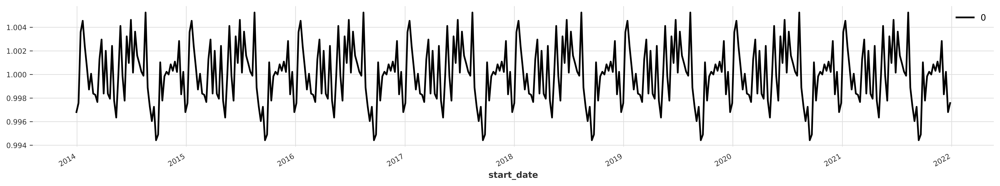

In [64]:
# UCRY Reddit Price
print(dstats.check_seasonality(ucry_reddit_price_ts))
trend, seasonal = dstats.extract_trend_and_seasonality(ucry_reddit_price_ts)
seasonal.plot()

(True, 5)


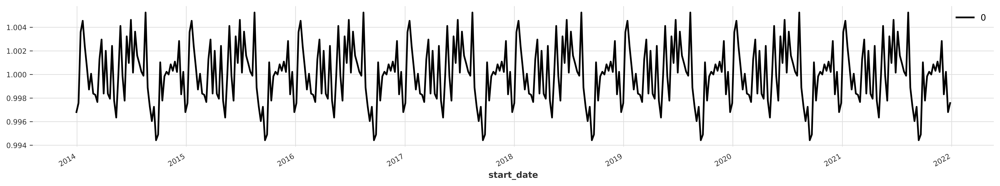

In [65]:
# UCRY Reddit Policy
print(dstats.check_seasonality(ucry_reddit_price_ts))
trend, seasonal = dstats.extract_trend_and_seasonality(ucry_reddit_price_ts)
seasonal.plot()

(True, 6)


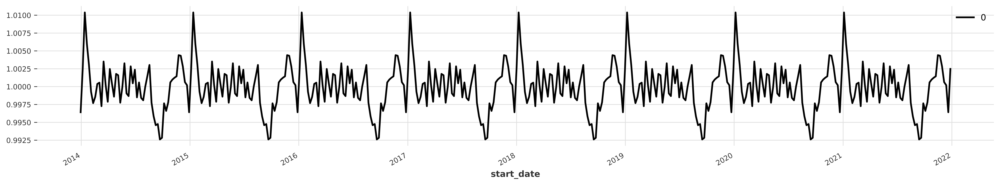

In [66]:
# LDA Reddit Price
print(dstats.check_seasonality(lda_reddit_price_ts))
trend, seasonal = dstats.extract_trend_and_seasonality(lda_reddit_price_ts)
seasonal.plot()

(True, 6)


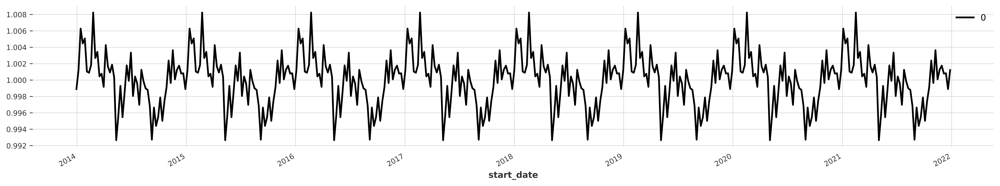

In [67]:
# LDA Reddit Policy
print(dstats.check_seasonality(lda_reddit_policy_ts))
trend, seasonal = dstats.extract_trend_and_seasonality(lda_reddit_policy_ts)
seasonal.plot()

(True, 12)


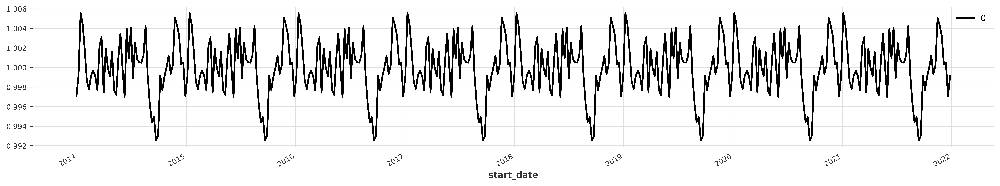

In [68]:
# Top2Vec Reddit Price
print(dstats.check_seasonality(t2v_reddit_price_ts))
trend, seasonal = dstats.extract_trend_and_seasonality(t2v_reddit_price_ts)
seasonal.plot()

(True, 13)


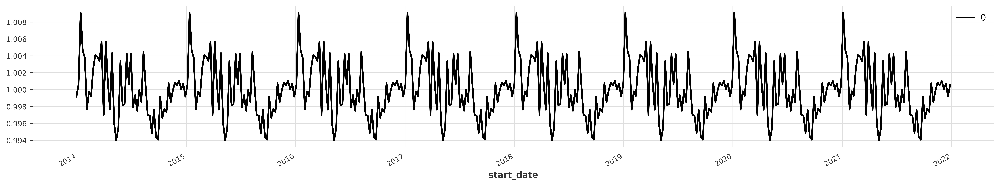

In [69]:
# Top2Vec Reddit Policy
print(dstats.check_seasonality(t2v_reddit_policy_ts))
trend, seasonal = dstats.extract_trend_and_seasonality(t2v_reddit_policy_ts)
seasonal.plot()

(True, 20)


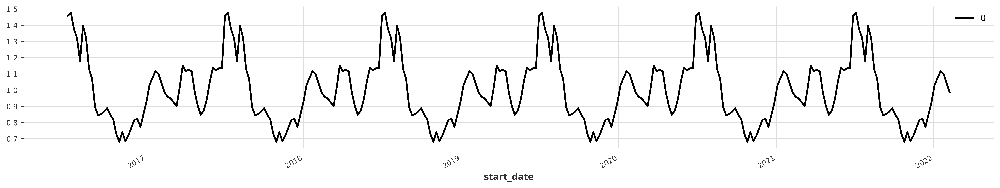

In [70]:
# VCRIX
print(dstats.check_seasonality(ucry_vcrix_ts))
trend, seasonal = dstats.extract_trend_and_seasonality(ucry_vcrix_ts)
seasonal.plot()

(True, 10)


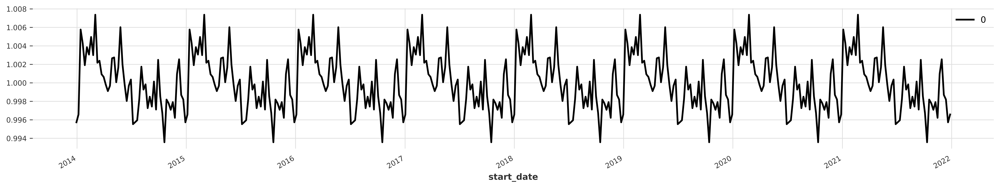

In [71]:
# Lucey Price
print(dstats.check_seasonality(ucry_price_ts))
trend, seasonal = dstats.extract_trend_and_seasonality(ucry_price_ts)
seasonal.plot()

(True, 22)


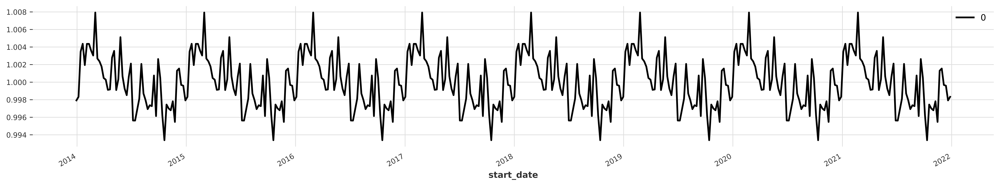

In [72]:
# Lucey Policy
print(dstats.check_seasonality(ucry_policy_ts))
trend, seasonal = dstats.extract_trend_and_seasonality(ucry_policy_ts)
seasonal.plot()

### Granger Causality Tests for h = 1, 4, 12
* Can only be applied to stationary time series

In [73]:
# Uncertainty Indices vs Price Returns (1 Weeks)


dstats.granger_causality_tests()

TypeError: granger_causality_tests() missing 3 required positional arguments: 'ts_cause', 'ts_effect', and 'maxlag'

#### Correlation between VCRIX and Lucey Reddit

In [ ]:
price_vcrix = (
    ucry_combined[ucry_combined.type == "Lucey-Reddit-Price"]
    .dropna()
    .merge(ucry_combined[ucry_combined.type == "VCRIX"], on="start_date")
)

r, p = stats.pearsonr(price_vcrix["index_value_x"], price_vcrix["index_value_y"])

print(f"VCRIX vs Lucey Reddit Price Index Correlation: {r} | P-Value: {p}")

VCRIX vs Lucey Reddit Price Index Correlation: 0.13878203678316667 | P-Value: 0.018660221916462737


In [ ]:
policy_vcrix = (
    ucry_combined[ucry_combined.type == "Lucey-Reddit-Policy"]
    .dropna()
    .merge(ucry_combined[ucry_combined.type == "VCRIX"], on="start_date")
)

r, p = stats.pearsonr(policy_vcrix["index_value_x"], policy_vcrix["index_value_y"])

print(f"VCRIX vs Lucey Reddit Price Index Correlation: {r} | P-Value: {p}")

VCRIX vs Lucey Reddit Price Index Correlation: 0.19173500100962493 | P-Value: 0.0010971179972081222
